# Suicide Rate Prediction
Socio-economic Info with Suicide Rates by Year and Country

### Knowing the Data


This dataset contains 12 features:

country: The country of residence of the individual  
<BR>year: The year the suicide happend 
<BR>sex: The gender of the individual (male/female)
<BR>age group: The age group of the individual
<BR>count of suicides: The count number of suicides that happend
<BR>population: The overall population of the country
<BR>suicide rate: The number of suicides per 100,000 person
<BR>country-year composite key: A code containing the country name plus the year of the suicide
<BR>HDI for year: Human Development Index is a statistic composite index of life expectancy, education, and per capita income indicators.
<BR>gdpforyear: The GDP of the country at that year
<BR>gdppercapita: The GDP per capita of the country at that year
<BR>generation: The name of the corresponding generation


During this analysis, we will first perform an exploratory data analysis where we will try to extract a few useful insights from our dataset. Secondly, we will clean our data and make the needed transformation(We will keep transforming our data whenever it's needed during the analysis).  Finally we will try to predict the number of suicides per 100k given the features we have.
    
And then we will dorm clusters based on demography and on the suicide rates.

#### Importing the Independencies

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data=pd.read_csv("master.csv")

In [3]:
data

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,156,624,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,156,624,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,156,624,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,156,624,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,156,624,900",796,Boomers
...,...,...,...,...,...,...,...,...,...,...,...,...
27815,Uzbekistan,2014,female,35-54 years,107,3620833,2.96,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation X
27816,Uzbekistan,2014,female,75+ years,9,348465,2.58,Uzbekistan2014,0.675,"63,067,077,179",2309,Silent
27817,Uzbekistan,2014,male,5-14 years,60,2762158,2.17,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation Z
27818,Uzbekistan,2014,female,5-14 years,44,2631600,1.67,Uzbekistan2014,0.675,"63,067,077,179",2309,Generation Z


In [4]:
data.isnull().sum()

country                   0
year                      0
sex                       0
age                       0
suicides_no               0
population                0
suicides/100k pop         0
country-year              0
HDI for year          19456
 gdp_for_year ($)         0
gdp_per_capita ($)        0
generation                0
dtype: int64

In [5]:
for i in data.country.unique():
    column_means = data[data['country']==i]['HDI for year'].mean()
    data[data['country']==i]=data[data['country']==i].fillna(column_means)

In [6]:
data.isnull().sum()

country                  0
year                     0
sex                      0
age                      0
suicides_no              0
population               0
suicides/100k pop        0
country-year             0
HDI for year          1486
 gdp_for_year ($)        0
gdp_per_capita ($)       0
generation               0
dtype: int64

In [7]:
for i in data.country.unique():
    if data[data['country']==i].shape[0]-data[data['country']==i]['HDI for year'].isnull().sum()==0 :
        print(i,data[data['country']==i].shape[0]-data[data['country']==i]['HDI for year'].isnull().sum())


Aruba 0
Cabo Verde 0
Dominica 0
Kiribati 0
Macau 0
Mongolia 0
Puerto Rico 0
Republic of Korea 0
Russian Federation 0
Saint Kitts and Nevis 0
San Marino 0


We find manually the HDI for the countries with all nan values.

In [8]:
data[data['country']=='Aruba']=data[data['country']=='Aruba'].fillna(0.908)

In [9]:
data[data['country']=='Cabo Verde']=data[data['country']=='Cabo Verde'].fillna(0.569)
data[data['country']=='Dominica']=data[data['country']=='Dominica'].fillna(0.703)
data[data['country']=='Kiribati']=data[data['country']=='Kiribati'].fillna(0.553)
data[data['country']=='Macau']=data[data['country']=='Macau'].fillna(0.944)
data[data['country']=='Mongolia']=data[data['country']=='Mongolia'].fillna(0.575)
data[data['country']=='Puerto Rico']=data[data['country']=='Puerto Rico'].fillna(0.845)
data[data['country']=='Republic of Korea']=data[data['country']=='Republic of Korea'].fillna(0.907)
data[data['country']=='Russian Federation']=data[data['country']=='Russian Federation'].fillna(0.735)
data[data['country']=='Saint Kitts and Nevis']=data[data['country']=='Saint Kitts and Nevis'].fillna(0.779)
data[data['country']=='San Marino']=data[data['country']=='San Marino'].fillna(0.875)


In [10]:
data.isnull().sum()

country               0
year                  0
sex                   0
age                   0
suicides_no           0
population            0
suicides/100k pop     0
country-year          0
HDI for year          0
 gdp_for_year ($)     0
gdp_per_capita ($)    0
generation            0
dtype: int64

In [11]:
data_without_missing=data.copy()

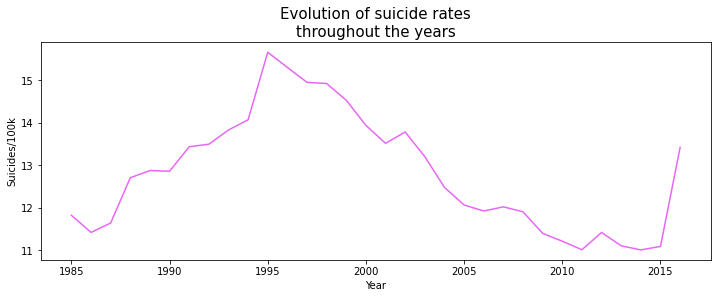

In [12]:
data1 = data.groupby('year', as_index=False).mean()

#Plotting the suicides rates by years 
fig, ax = plt.subplots(figsize=(12,4))
sns.lineplot(x='year', y='suicides/100k pop', color=sns.husl_palette(6)[5], data=data1, ax=ax)
plt.xlabel('Year')
plt.ylabel('Suicides/100k')
plt.title('Evolution of suicide rates\nthroughout the years', size=15)
plt.show()

From the line plot above we can see that the suicide rates kept oscilating between 11 and 16 suicide per 100,000 person. In 1995 the suicde rates peaked reaching almost 16 suicide per 100,000 individual. It started dropping afterwards to reach a minimum of 11 suicide per 100,000 individual in 2010 and 2014.

<AxesSubplot:xlabel='year', ylabel='suicides/100k pop'>

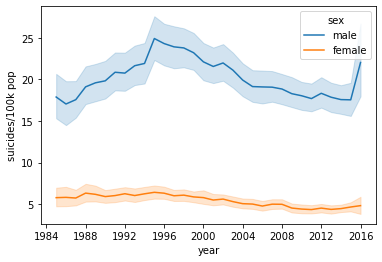

In [13]:
data["year"] = pd.to_datetime(data["year"], format = "%Y")
data1 = data.groupby(["year", "sex"]).agg("mean").reset_index()
sns.lineplot(x = "year", y = "suicides/100k pop", hue = "sex", data = data)

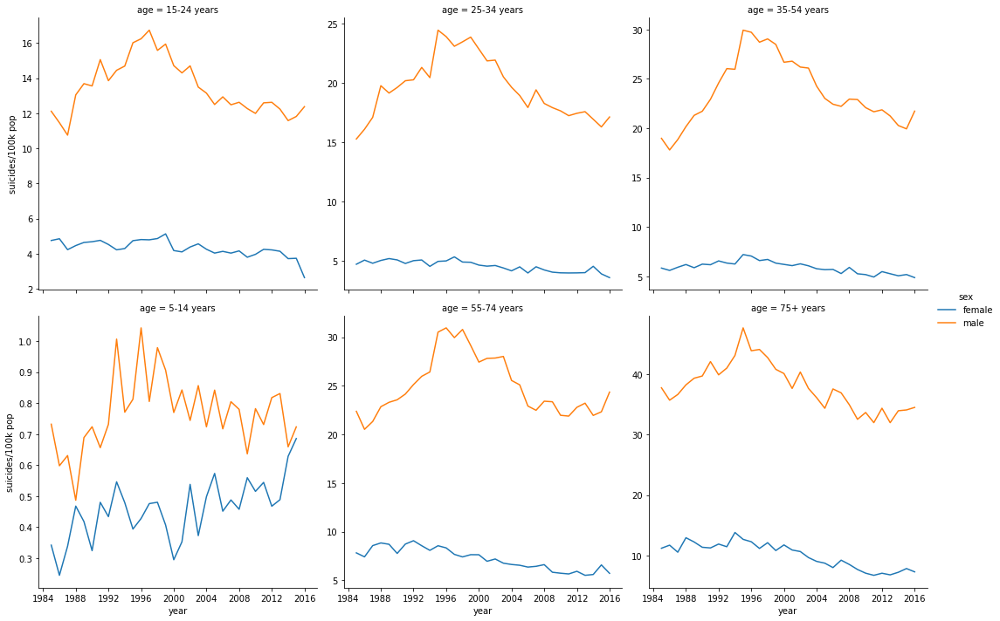

In [14]:
data1 = data.groupby(["year", "sex", "age"]).agg("mean").reset_index()

sns.relplot(x = "year", y = "suicides/100k pop", 
            hue = "sex", col = "age", col_wrap = 3, data = data1, 
            facet_kws=dict(sharey=False), kind = "line")

In [15]:
ns = data['suicides_no'].groupby(data.age).sum()

In [16]:
c=pd.DataFrame(ns)
d=c.reset_index()

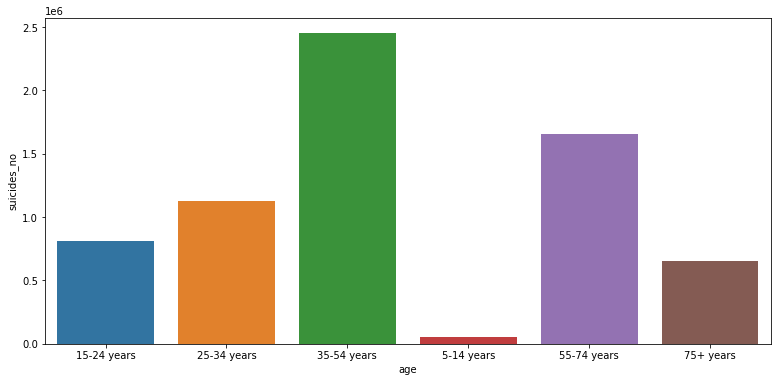

In [17]:
plt.figure(figsize=(13,6))
sns.barplot(x = 'age', y = 'suicides_no',data=d)
plt.show()

In [18]:
data['suicides_no'].sum()

6748420

In [19]:
ns = data['suicides_no'].groupby(data.generation).sum()
c=pd.DataFrame(ns)
d=c.reset_index()

<AxesSubplot:xlabel='generation', ylabel='suicides_no'>

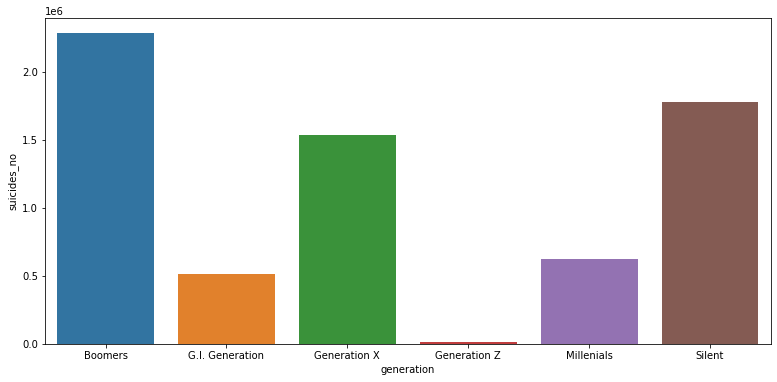

In [20]:
plt.figure(figsize=(13,6))
sns.barplot(x = 'generation', y = 'suicides_no',data=d)

<AxesSubplot:xlabel='age'>

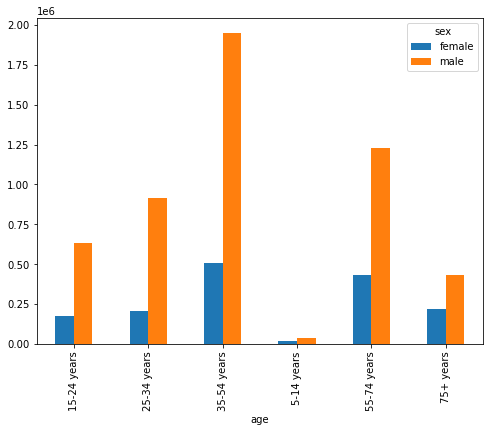

In [21]:
# Seeing the sex wise categorization of age in suicide numbers
data1 = data.groupby(['age','sex'])['suicides_no'].sum().unstack(fill_value=0)
data1.plot(kind='bar',legend=True,figsize=(8,6))

In [22]:
data1

sex,female,male
age,,
15-24 years,175437,633105
25-34 years,208823,915089
35-54 years,506233,1945908
5-14 years,16997,35267
55-74 years,430036,1228407
75+ years,221984,431134


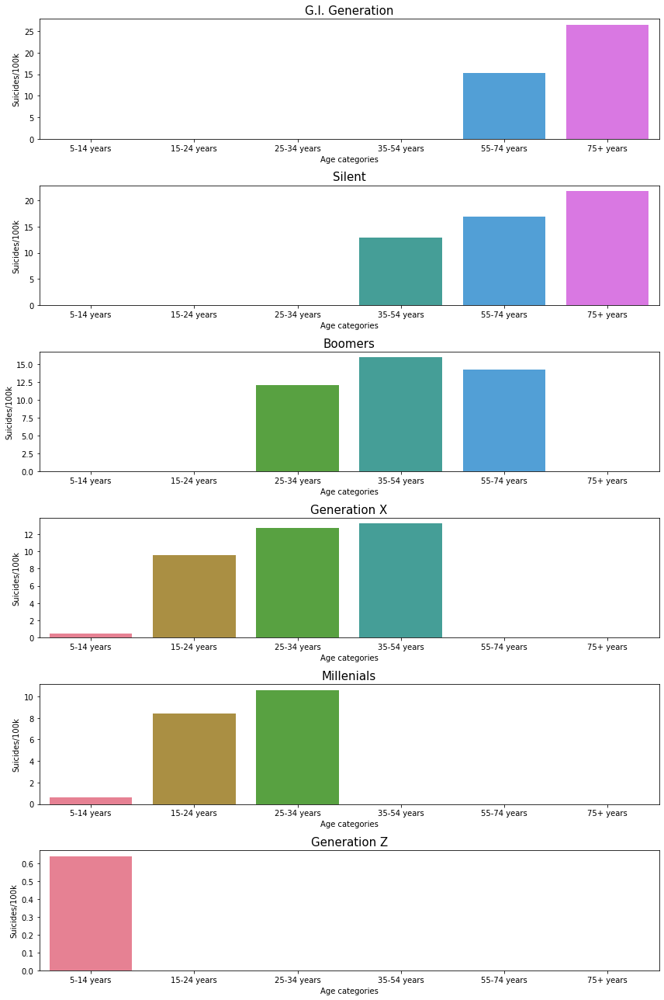

In [23]:
data2 = data.groupby(['generation', 'age'], as_index=False).mean()

#Making a list containing all the gens 
gens = ['G.I. Generation', 'Silent', 'Boomers', 'Generation X', 'Millenials', 'Generation Z']

#Creating the axis of the plots
plt.figure(figsize=(12,18))
ax1 = plt.subplot2grid((6,1),(0,0))
ax2 = plt.subplot2grid((6,1),(1,0))
ax3 = plt.subplot2grid((6,1),(2,0))
ax4 = plt.subplot2grid((6,1),(3,0))
ax5 = plt.subplot2grid((6,1),(4,0))
ax6 = plt.subplot2grid((6,1),(5,0))

#Making a list containing all the axes
axes = [ax1, ax2, ax3, ax4, ax5, ax6]
#Making a for loop to plot the needed plots 
for gen, ax in zip(gens, axes):
    sns.barplot(x='age', y='suicides/100k pop', palette='husl', 
                data=data2[data2['generation'] == gen],
                ax=ax, order=['5-14 years', '15-24 years', '25-34 years', '35-54 years', 
                          '55-74 years', '75+ years'])
    ax.set_xlabel('Age categories')
    ax.set_ylabel('Suicides/100k')
    ax.set_title(gen, size=15)
plt.tight_layout()

From the plot above we can see that unfortunatly, we don't have every age category for each generation. This is due to the fact the data collection started from around the year 1985, that means that:

people who belong to the G.I. Generation at the year of 1985, will be already 55+ years, so we won't have any people from this generation who belong to younger age category who commited suicide.

equivalently, we won't have any 25-34 years (or younger) people who belong to the Silent Generation and commited suicide because this generation in 1985 were at least 35 years old.
The same goes for younger generations, we might have the young age categories but since the data collection stopped at around 2015 or so, we won't be seeing any boomers older than 75, or millenials older than 35 years old.

In [24]:
data2 = data.groupby(['country'])['suicides_no'].sum()

In [25]:
data3=pd.DataFrame(data2).sort_values(by='suicides_no',ascending=True).tail()

In [26]:
data3

,suicides_no
country,
Ukraine,319950
France,329127
Japan,806902
United States,1034013
Russian Federation,1209742


<AxesSubplot:xlabel='country'>

<Figure size 576x432 with 0 Axes>

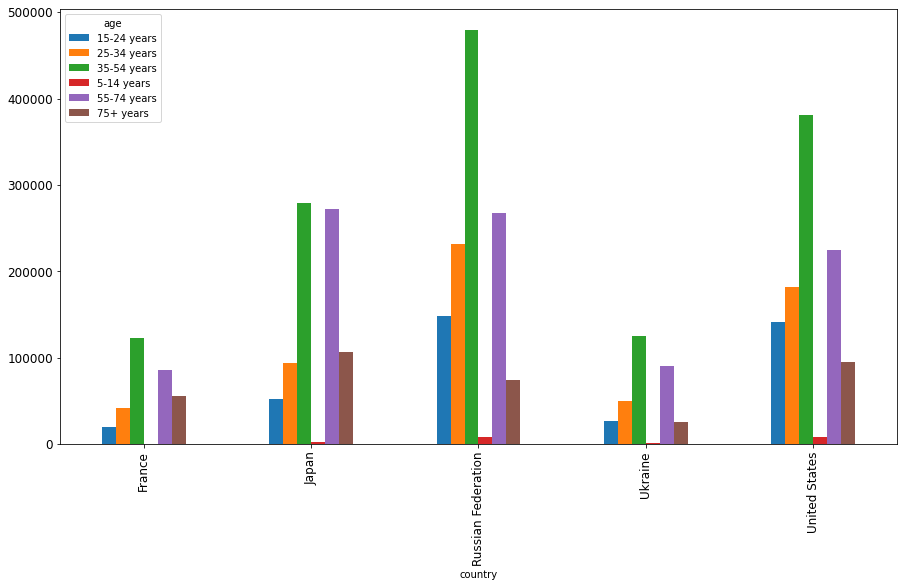

In [27]:
plt.figure(figsize=(8,6))
data4 = data.loc[((data.country=='Russian Federation') | (data.country=='United States')
                     | (data.country=='Japan') | (data.country=='France')
                    | (data.country=='Ukraine'))].groupby(['country','age'])['suicides_no'].sum().unstack(fill_value=0)
data4.plot.bar(figsize=(15,8),fontsize=12)

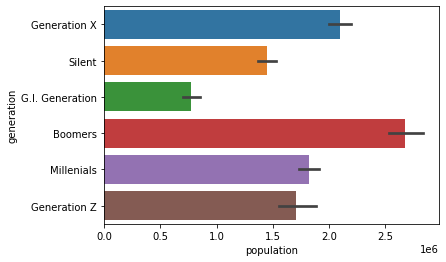

In [28]:
ax = sns.barplot(y="generation", x="population",data=data)

In [29]:
data.rename(columns={" gdp_for_year ($) ":"gdp_for_year", "gdp_per_capita ($)":"gdp_per_capita" , "HDI for year" : "HDI_for_year"}, inplace=True)
data.head()

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI_for_year,gdp_for_year,gdp_per_capita,generation
0,Albania,1987-01-01,male,15-24 years,21,312900,6.71,Albania1987,0.673,"2,156,624,900",796,Generation X
1,Albania,1987-01-01,male,35-54 years,16,308000,5.19,Albania1987,0.673,"2,156,624,900",796,Silent
2,Albania,1987-01-01,female,15-24 years,14,289700,4.83,Albania1987,0.673,"2,156,624,900",796,Generation X
3,Albania,1987-01-01,male,75+ years,1,21800,4.59,Albania1987,0.673,"2,156,624,900",796,G.I. Generation
4,Albania,1987-01-01,male,25-34 years,9,274300,3.28,Albania1987,0.673,"2,156,624,900",796,Boomers


In [30]:
data.gdp_for_year = data.gdp_for_year.astype('object')

In [31]:
data.gdp_for_year = data.gdp_for_year.apply(lambda x : x.replace(",", ""))

In [32]:
data.gdp_for_year = data.gdp_for_year.apply(lambda x : x.replace(",", ""))
data.gdp_for_year = data.gdp_for_year.astype('int64')

In [33]:
data.gdp_for_year = pd.to_numeric(data.gdp_for_year,errors='coerce')

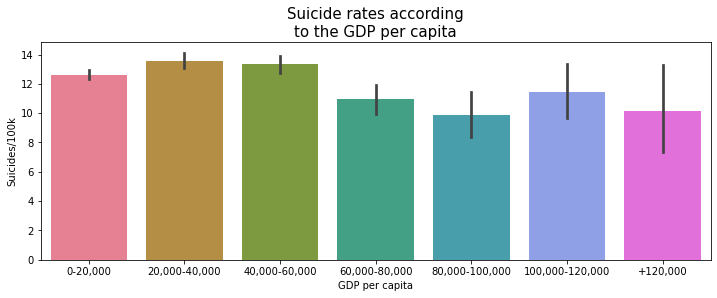

In [34]:
#Making bins and labels for the gdp_per_capita feature
bins = list(range(0, 160000, 20000))
labels = ['0-20,000', '20,000-40,000', '40,000-60,000', '60,000-80,000', '80,000-100,000', '100,000-120,000', '+120,000']
data['gdp_per_capita_bins'] = pd.cut(data['gdp_per_capita'], bins=bins, labels=labels)

#Plotting the suicide rates according to the gbp per capita bins 
fig, ax = plt.subplots(figsize=(12,4))
sns.barplot(x='gdp_per_capita_bins', y='suicides/100k pop', palette='husl', data=data, ax=ax)
plt.xlabel('GDP per capita')
plt.ylabel('Suicides/100k')
plt.title('Suicide rates according\nto the GDP per capita', size=15)
plt.show()

In [35]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27820 entries, 0 to 27819
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   country              27820 non-null  object        
 1   year                 27820 non-null  datetime64[ns]
 2   sex                  27820 non-null  object        
 3   age                  27820 non-null  object        
 4   suicides_no          27820 non-null  int64         
 5   population           27820 non-null  int64         
 6   suicides/100k pop    27820 non-null  float64       
 7   country-year         27820 non-null  object        
 8   HDI_for_year         27820 non-null  float64       
 9   gdp_for_year         27820 non-null  int64         
 10  gdp_per_capita       27820 non-null  int64         
 11  generation           27820 non-null  object        
 12  gdp_per_capita_bins  27820 non-null  category      
dtypes: category(1), datetime64[ns](

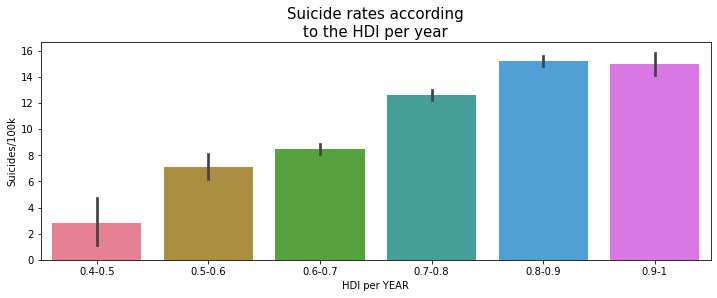

In [36]:
#Making bins and labels for the gdp_per_capita feature
bins = (0.4,0.5,0.6,0.7,0.8,0.9,1)
labels = ['0.4-0.5','0.5-0.6','0.6-0.7','0.7-0.8','0.8-0.9','0.9-1']
data['HDI_for_year_bins'] = pd.cut(data['HDI_for_year'], bins=bins, labels=labels)

#Plotting the suicide rates according to the gbp per capita bins 
fig, ax = plt.subplots(figsize=(12,4))
sns.barplot(x='HDI_for_year_bins', y='suicides/100k pop', palette='husl', data=data, ax=ax)
plt.xlabel('HDI per YEAR')
plt.ylabel('Suicides/100k')
plt.title('Suicide rates according\nto the HDI per year', size=15)
plt.show()

In [37]:
words_dict = {"5-14 years":0,"15-24 years": 1, "25-34 years": 2, "35-54 years": 3, "55-74 years": 4, "75+ years": 5}
def num_map(series):
    return series.map(words_dict)

data[['age']] = data[['age']].apply(num_map, axis = 1)

In [38]:
data_final = data.drop(['suicides_no', 'gdp_for_year', 'country-year', 'generation','gdp_per_capita_bins','HDI_for_year_bins'], axis=1)
data_final.head()

,country,year,sex,age,population,suicides/100k pop,HDI_for_year,gdp_per_capita
0,Albania,1987-01-01,male,1,312900,6.71,0.673,796
1,Albania,1987-01-01,male,3,308000,5.19,0.673,796
2,Albania,1987-01-01,female,1,289700,4.83,0.673,796
3,Albania,1987-01-01,male,5,21800,4.59,0.673,796
4,Albania,1987-01-01,male,2,274300,3.28,0.673,796


'country-year'is just country and years written together so we dropped it. 
"gdp_per_capita" is correlated with "gdp_per_year" so we dropped one of this.
'suicide_no' is correlated with 'suicide/100k' and 'population' so dropping this would we a good idea. 
'generation' is correlated with 'year' and 'age' so dropping this would we a good idea. 


Here we can see how our dataset looks after deletion. The next step is to remove the outliers from our numeric attributes, except for the year attribute. We are going to apply the method that applies the Z-Score technique.


In [39]:
import scipy.stats

def remove_outliers(df, df_entero):
    z_scores = scipy.stats.zscore(df)
    abs_z_scores = np.abs(z_scores)
    filtered_entries = (abs_z_scores < 3).all(axis=1)
    return df_entero[filtered_entries]

In [40]:
data_without_missing.head()

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,0.673,"2,156,624,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,0.673,"2,156,624,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,0.673,"2,156,624,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,0.673,"2,156,624,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,0.673,"2,156,624,900",796,Boomers


In [41]:
data_cluster= data_without_missing.drop(['suicides_no', ' gdp_for_year ($) ', 'country-year', 'generation'], axis=1)
data_cluster = remove_outliers(data_cluster[['suicides/100k pop']], data_cluster)


In [42]:
data_final = remove_outliers(data_final[['suicides/100k pop']], data_final)
data_final.describe()

,age,population,suicides/100k pop,HDI_for_year,gdp_per_capita
count,27069.000000,2.706900e+04,27069.000000,27069.000000,27069.000000
mean,2.451919,1.859128e+06,10.610673,0.776217,17046.205475
std,1.694342,3.925184e+06,13.270310,0.089629,19006.612570
min,0.000000,2.780000e+02,0.000000,0.483000,251.000000
25%,1.000000,9.742500e+04,0.840000,0.711000,3504.000000
50%,2.000000,4.387260e+05,5.570000,0.779833,9501.000000
75%,4.000000,1.507522e+06,15.270000,0.853800,25165.000000
max,5.000000,4.380521e+07,69.660000,0.944000,126352.000000



We see that several rows have been deleted and the deviations of the data are not so big anymore and the maximum values ​​are smaller now.

In [43]:
print('Clean dataset dimensions: ', data_final.shape)
data_final['year'] = pd.DatetimeIndex(data_final['year']).year
data_final.head()

Clean dataset dimensions:  (27069, 8)


,country,year,sex,age,population,suicides/100k pop,HDI_for_year,gdp_per_capita
0,Albania,1987,male,1,312900,6.71,0.673,796
1,Albania,1987,male,3,308000,5.19,0.673,796
2,Albania,1987,female,1,289700,4.83,0.673,796
3,Albania,1987,male,5,21800,4.59,0.673,796
4,Albania,1987,male,2,274300,3.28,0.673,796


We can see that around 800 elements have been removed, which is quite little considering the amount of data we have, so we continue to count a good volume of data to do the study.


In [44]:
from matplotlib.pyplot import figure

def histograms(dataset, index):
    figure(num=None, figsize=(15, 6), dpi=80, facecolor='w', edgecolor='k')
    data = dataset.values
    columnName = list(dataset)
    x = data[:, index]
    plt.figure()
    title="Histograms for each attribute "
    plt.title(title)
    plt.xlabel(columnName[index])
    plt.ylabel("Count")
    hist = plt.hist(x, bins=11, histtype="bar", rwidth=0.8)
    plt.show()

<Figure size 1200x480 with 0 Axes>

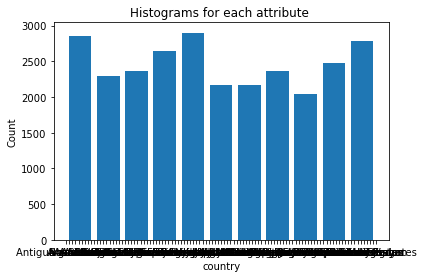

<Figure size 1200x480 with 0 Axes>

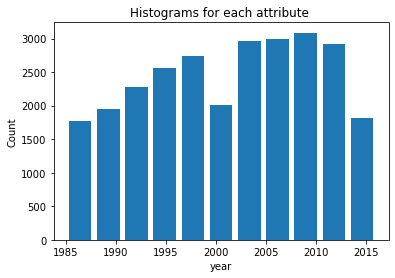

<Figure size 1200x480 with 0 Axes>

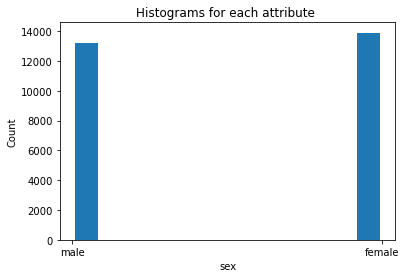

<Figure size 1200x480 with 0 Axes>

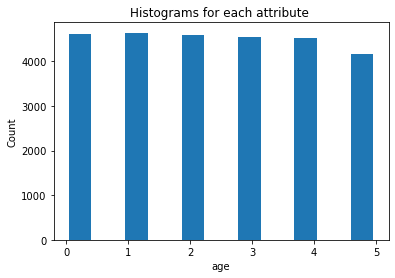

<Figure size 1200x480 with 0 Axes>

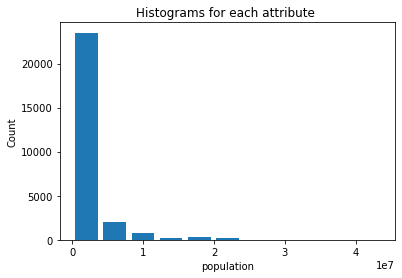

<Figure size 1200x480 with 0 Axes>

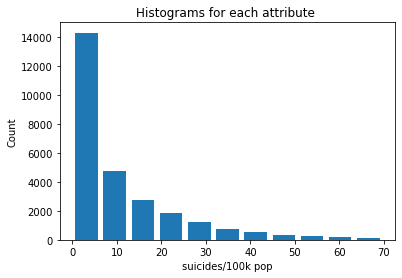

<Figure size 1200x480 with 0 Axes>

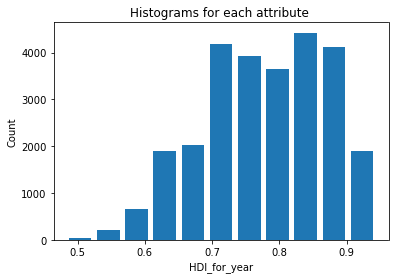

<Figure size 1200x480 with 0 Axes>

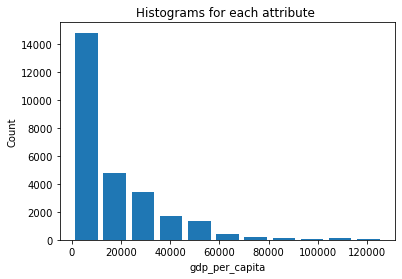

In [45]:
for i in range(data_final.shape[1]):
    histograms(data_final, i)

What we want to see in this study is the proportion of suicides per 100k inhabitants. The distribution of these is pretty bad so it's best to break the study down into others so that we can predict something. The following studies would be carried out and then the information between these would be contrasted to reason things out. The studies would be:

For each country we would look at suicides independently. Here we could see more in detail for each country that occurs, if an age group or a sex is more likely.

For each country and year we would look at the total suicides, with this study we could see the difference between the countries and see if rich countries have more suicides or the other way around or if they all act in a similar way.

Finally, we would do a clustering to group the countries and thus analyze certain trends according to the characteristics of each group.

## Study By Country

In [46]:
dict_df = {}
country_name = []
for item in data_final['country'].unique():
    df = data_final.loc[data_final['country'] == item]
    if df.shape[0] > 50:
            dict_df[item] = df
            country_name.append(item)


Here we see an example from the United States of how the datasets look after the elimination of the columns.

In [47]:
if 'country' in dict_df['United States']:
    for item in country_name:
        dict_df[item] = dict_df[item].drop(['country'], axis=1)
dict_df['United States'].head()

,year,sex,age,population,suicides/100k pop,HDI_for_year,gdp_per_capita
26848,1985,male,5,4064000,53.57,0.841,19693
26849,1985,male,4,17971000,29.50,0.841,19693
26850,1985,male,2,20986000,24.46,0.841,19693
26851,1985,male,3,26589000,22.77,0.841,19693
26852,1985,male,1,19962000,21.38,0.841,19693


In [48]:
aux = []
for item in country_name:
    if dict_df[item]['suicides/100k pop'].quantile(0.50) < 5:
        del dict_df[item]
        aux.append(item)
for x in aux:
    country_name.remove(x)
print('Number of Countries: ', len(country_name))
print(country_name)

Number of Countries:  53
['Argentina', 'Australia', 'Austria', 'Belarus', 'Belgium', 'Bulgaria', 'Canada', 'Croatia', 'Cuba', 'Czech Republic', 'Denmark', 'Ecuador', 'El Salvador', 'Estonia', 'Finland', 'France', 'Germany', 'Guyana', 'Hungary', 'Iceland', 'Ireland', 'Israel', 'Italy', 'Japan', 'Kazakhstan', 'Kyrgyzstan', 'Latvia', 'Lithuania', 'Luxembourg', 'Mauritius', 'Netherlands', 'New Zealand', 'Norway', 'Poland', 'Portugal', 'Republic of Korea', 'Romania', 'Russian Federation', 'Serbia', 'Singapore', 'Slovakia', 'Slovenia', 'Spain', 'Sri Lanka', 'Suriname', 'Sweden', 'Switzerland', 'Trinidad and Tobago', 'Turkmenistan', 'Ukraine', 'United States', 'Uruguay', 'Uzbekistan']


In [49]:
words_dict = {"female":0,"male": 1}
def num_map(series):
    return series.map(words_dict)

for item in country_name:
    dict_df[item][['sex']] = dict_df[item][['sex']].apply(num_map, axis = 1)

In [50]:
dict_df['United States'].head()


,year,sex,age,population,suicides/100k pop,HDI_for_year,gdp_per_capita
26848,1985,1,5,4064000,53.57,0.841,19693
26849,1985,1,4,17971000,29.50,0.841,19693
26850,1985,1,2,20986000,24.46,0.841,19693
26851,1985,1,3,26589000,22.77,0.841,19693
26852,1985,1,1,19962000,21.38,0.841,19693



We can see how the coded categorical columns have remained, with this we can get the correlations and observe the attributes that are most related

C:\Users\Shivam\AppData\Local\Temp/ipykernel_24728/2414531370.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10,10))


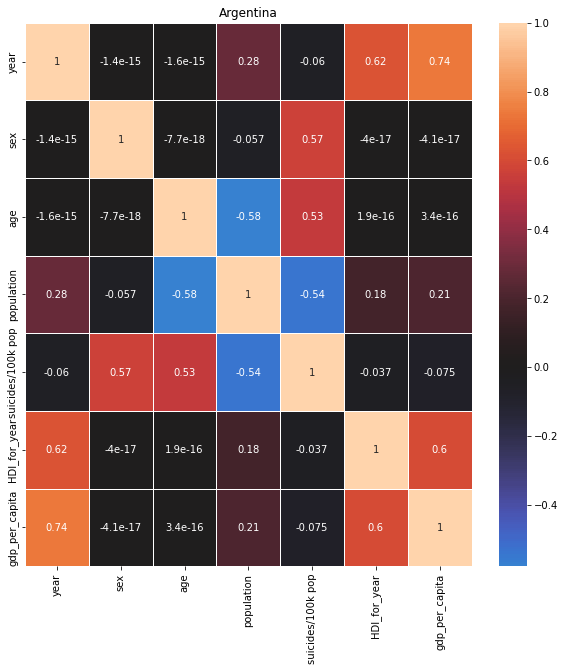

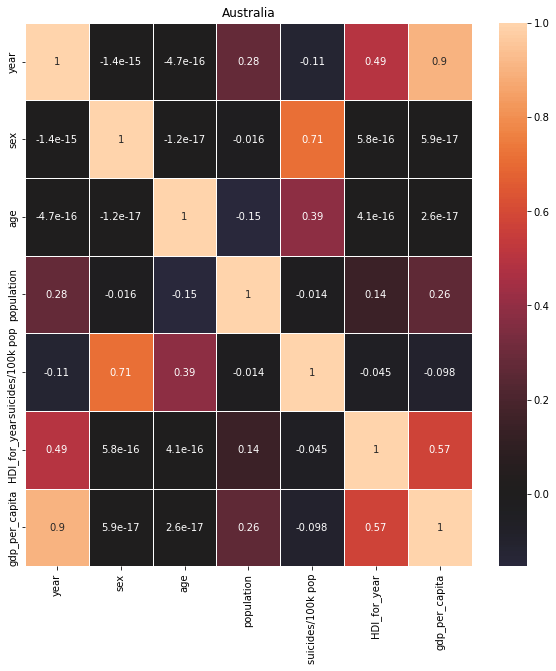

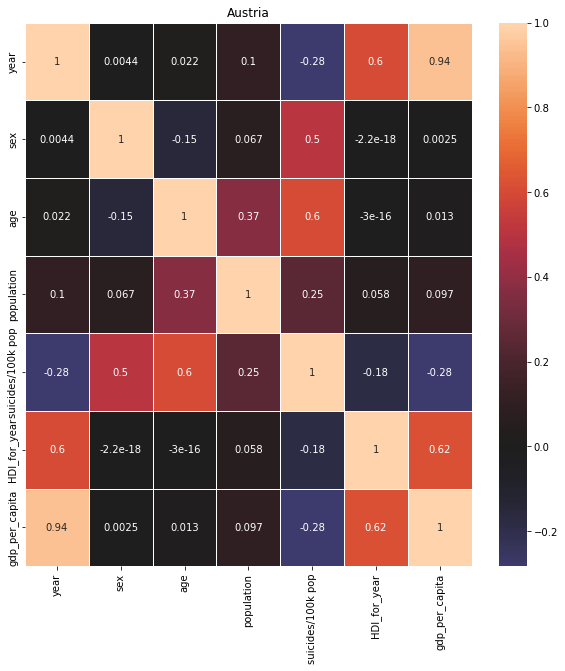

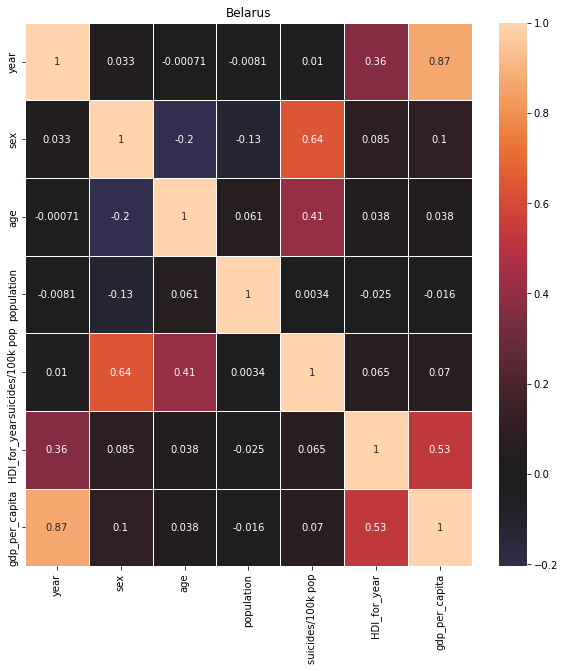

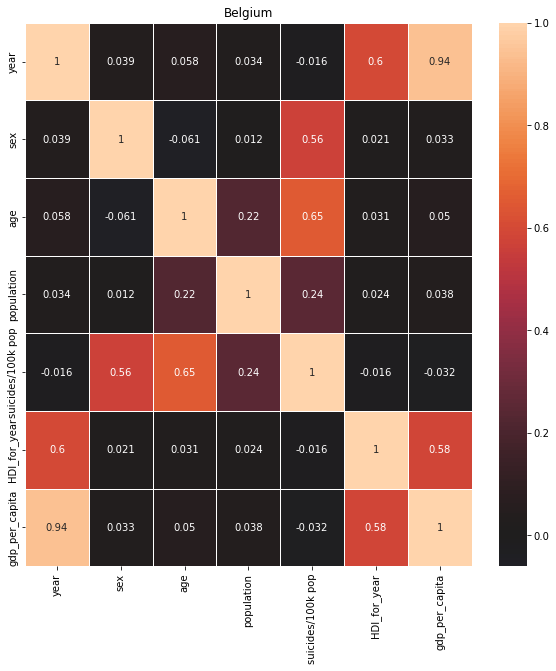

...

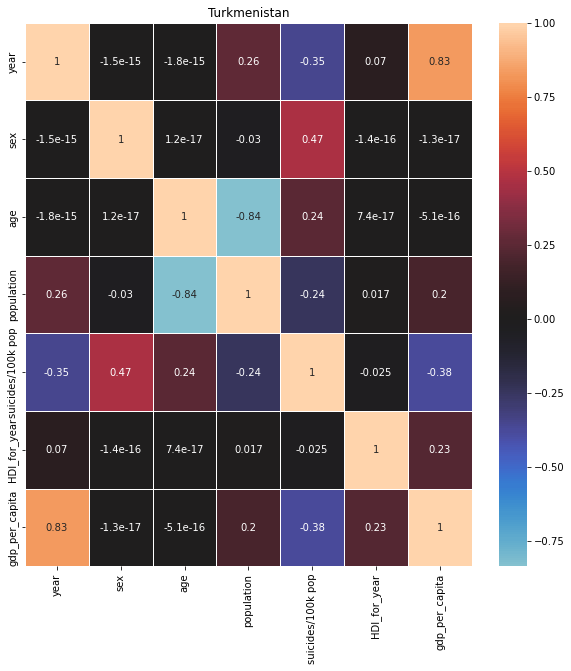

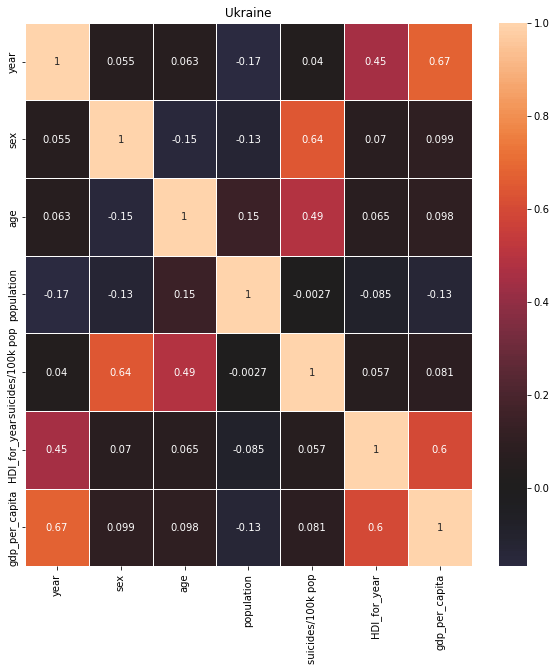

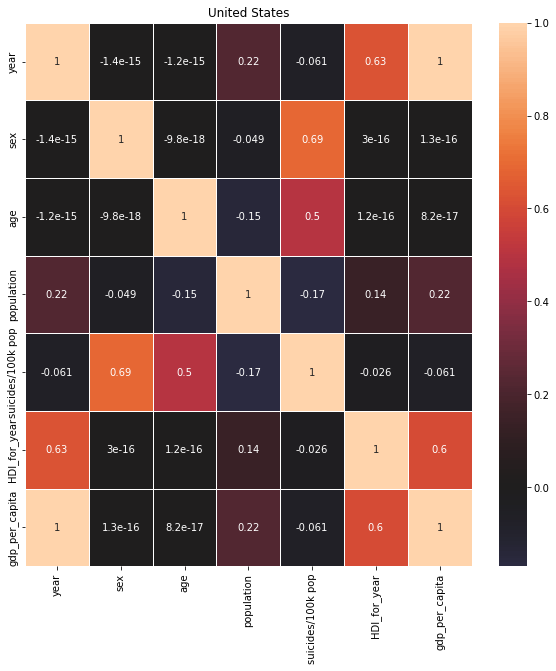

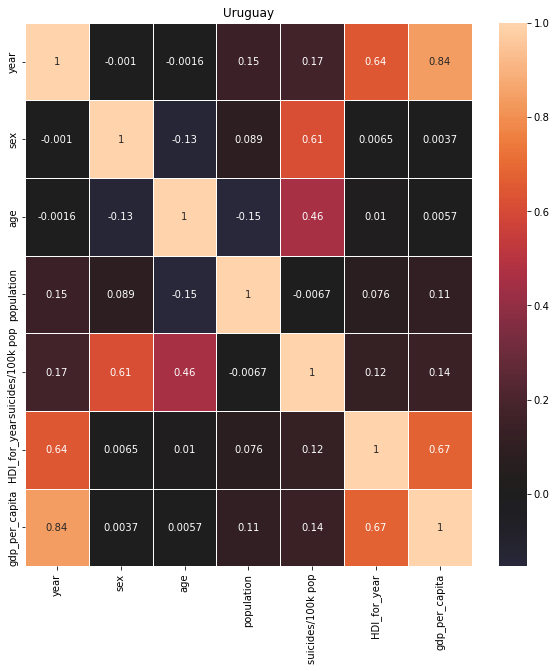

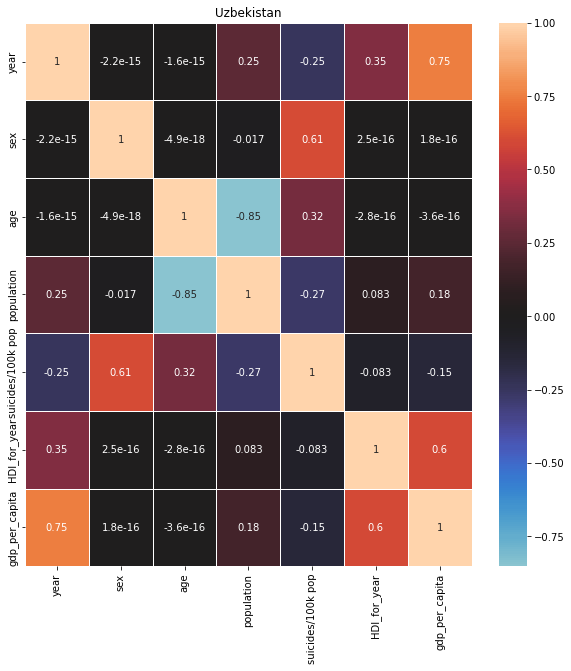

In [51]:
for item in country_name:
    corr = dict_df[item].corr()

    plt.figure(figsize=(10,10))

    ax = sns.heatmap(corr, annot=True, linewidths=1, center=0)
    
    ax.set_title(item)

In [52]:
from sklearn import preprocessing

def standarize(x_train, x_test):
    scaler = preprocessing.MinMaxScaler()
    scaler.fit(x_train)
    return scaler.transform(x_train), scaler.transform(x_test)

In [53]:
dict_x_y = {}
for item in country_name:
    dict_x_y[item] = {}
    dict_x_y[item]['x'] = dict_df[item].loc[:,dict_df[item].columns != "suicides/100k pop"].to_numpy()
    dict_x_y[item]['y'] = dict_df[item].loc[:,"suicides/100k pop"].to_numpy()
    dict_x_y[item]['x_s'], aux = standarize(dict_x_y[item]['x'], dict_x_y[item]['x'])
print(dict_x_y['United States']['x_s'][2])

[0.         1.         0.4        0.42580481 0.         0.        ]


In [54]:
dict_df.keys()

dict_keys(['Argentina', 'Australia', 'Austria', 'Belarus', 'Belgium', 'Bulgaria', 'Canada', 'Croatia', 'Cuba', 'Czech Republic', 'Denmark', 'Ecuador', 'El Salvador', 'Estonia', 'Finland', 'France', 'Germany', 'Guyana', 'Hungary', 'Iceland', 'Ireland', 'Israel', 'Italy', 'Japan', 'Kazakhstan', 'Kyrgyzstan', 'Latvia', 'Lithuania', 'Luxembourg', 'Mauritius', 'Netherlands', 'New Zealand', 'Norway', 'Poland', 'Portugal', 'Republic of Korea', 'Romania', 'Russian Federation', 'Serbia', 'Singapore', 'Slovakia', 'Slovenia', 'Spain', 'Sri Lanka', 'Suriname', 'Sweden', 'Switzerland', 'Trinidad and Tobago', 'Turkmenistan', 'Ukraine', 'United States', 'Uruguay', 'Uzbekistan'])

In [55]:
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

Adjusted R2 for Switzerland = 0.9181025198920413
The mean squared error on test set for Switzerland is= 19.156503832319373
Adjusted R2 for France = 0.902507664945763
The mean squared error on test set for France is= 54.3564922825089
Adjusted R2 for United States = 0.8747012215805634
The mean squared error on test set for United States is= 53.987461576383446
Adjusted R2 for Japan = 0.9228015339778249
The mean squared error on test set for Japan is= 79.95520630438784
Adjusted R2 for Canada = 0.89032901567454
The mean squared error on test set for Canada is= 25.289541083485894
Adjusted R2 for Spain = 0.8576078603380369
The mean squared error on test set for Spain is= 28.63041720635827


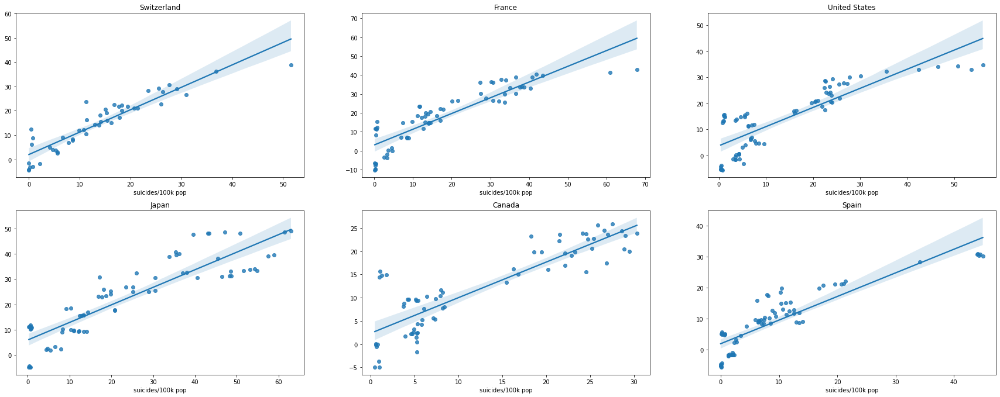

In [56]:
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')
plt.figure(figsize=(30,30))
lst=['Switzerland','France','United States', 'Japan', 'Canada', 'Spain']
for i in range(len(lst)):
    arg=dict_df[lst[i]]
    X_train,X_test,y_train,y_test=train_test_split(arg.drop(columns=['suicides/100k pop']),arg['suicides/100k pop'],
                                              test_size=0.2,random_state=42)
    model = sm.OLS(y_train,X_train).fit()
    print("Adjusted R2 for",lst[i],"=",model.rsquared_adj)
    print("The mean squared error on test set for",lst[i],"is=",mean_squared_error(y_test,model.predict(X_test)))
    print("="*100)
    plt.subplot(5,3,i+1)
    sns.regplot(y_test,model.predict(X_test))
    plt.title(lst[i])

# Gradient Boosting

Adjusted R2 for Switzerland = 0.8171639130223541
The mean squared error on test set for Switzerland is= 18.60689214558201
Adjusted R2 for France = 0.8598950558703848
The mean squared error on test set for France is= 31.805491860654435
Adjusted R2 for United States = 0.8618284321744081
The mean squared error on test set for United States is= 23.63423622326184
Adjusted R2 for Japan = 0.7888586873013731
The mean squared error on test set for Japan is= 68.11606859784447
Adjusted R2 for Canada = 0.8417552723501974
The mean squared error on test set for Canada is= 14.46867407285554
Adjusted R2 for Spain = 0.8658594666530333
The mean squared error on test set for Spain is= 15.800641479827988


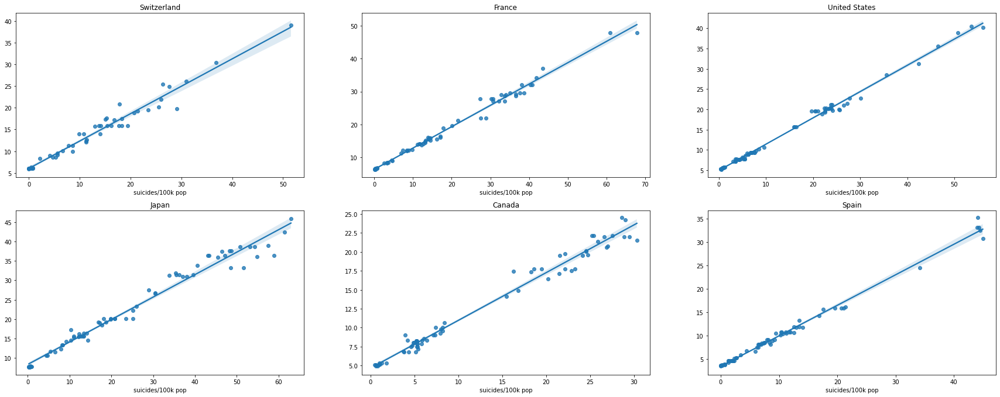

In [57]:
from sklearn import ensemble
from sklearn.metrics import r2_score


plt.figure(figsize=(30,30))
lst=['Switzerland','France','United States', 'Japan', 'Canada', 'Spain']
for i in range(len(lst)):
    arg=dict_df[lst[i]]
    X_train,X_test,y_train,y_test=train_test_split(arg.drop(columns=['suicides/100k pop']),arg['suicides/100k pop'],
                                              test_size=0.2,random_state=42)
    params={"n_estimators":100,"max_depth":6,"min_samples_split":10,"learning_rate":0.01,"loss":"squared_error"}
    reg=ensemble.GradientBoostingRegressor(**params)
    reg.fit(X_train,y_train)
    y_pred = reg.predict(X_test)
    r_squared = r2_score(y_test, y_pred)
    adjusted_r_squared = 1 - (1-r_squared)*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1)
    print("Adjusted R2 for",lst[i],"=",adjusted_r_squared)
    mse=mean_squared_error(y_test,reg.predict(X_test))
    print("The mean squared error on test set for",lst[i],"is=",mse)
    print("="*100)
    plt.subplot(5,3,i+1)
    sns.regplot(y_test,reg.predict(X_test))
    plt.title(lst[i])
 

We kept the learning rate low and increased the estimators proportionally to get more robust models.

And observe that the statistics has improved a lot.
We can clearly see that the value of Adjusted R2 is better as it is much closer to 1 ans the mean squared error is also significantly decreased.
This can be seen in the plots also as the test dataset and the predicted points are much closer to the fitted model indicating a better fit.

# XGBoost

In [58]:
!pip install xgboost

In [59]:
import xgboost
from xgboost import XGBRegressor
xgb = XGBRegressor(n_estimators=100, max_depth=7, eta=0.1, subsample=0.7, colsample_bytree=0.8)

Adjusted R2 for Switzerland = 0.9515316098542428
The mean squared error on test set for Switzerland is= 4.932538881245886
Adjusted R2 for France = 0.9844309464222938
The mean squared error on test set for France is= 3.5343606888399477
Adjusted R2 for United States = 0.9877792220007267
The mean squared error on test set for United States is= 2.090363152218446
Adjusted R2 for Japan = 0.9554292276608104
The mean squared error on test set for Japan is= 14.3789282509983
Adjusted R2 for Canada = 0.953766065266528
The mean squared error on test set for Canada is= 4.227273430838483
Adjusted R2 for Spain = 0.9865604202632928
The mean squared error on test set for Spain is= 1.5830709462739156


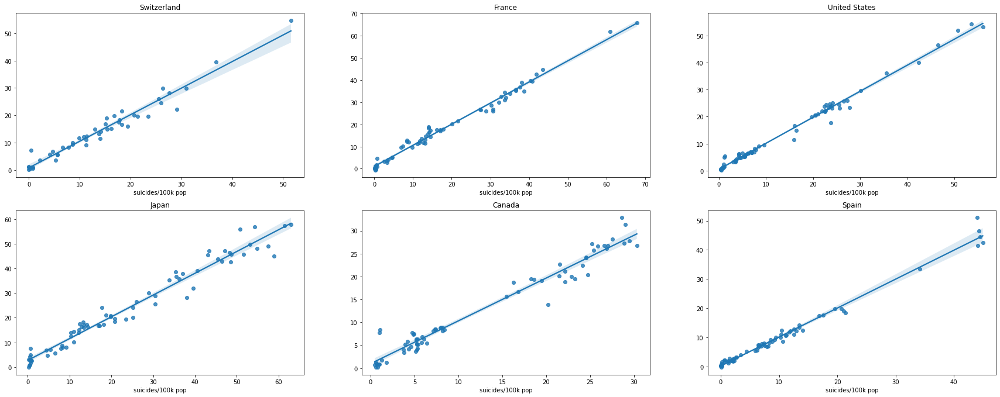

In [60]:

plt.figure(figsize=(30,30))
lst=['Switzerland','France','United States', 'Japan', 'Canada', 'Spain']
for i in range(len(lst)):
    arg=dict_df[lst[i]]
    X_train,X_test,y_train,y_test=train_test_split(arg.drop(columns=['suicides/100k pop']),arg['suicides/100k pop'],
                                              test_size=0.2,random_state=42)
    xgb.fit(X_train,y_train)
    y_pred = xgb.predict(X_test)
    r_squared = r2_score(y_test, y_pred)
    adjusted_r_squared = 1 - (1-r_squared)*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1)
    print("Adjusted R2 for",lst[i],"=",adjusted_r_squared)
    mse=mean_squared_error(y_test,xgb.predict(X_test))
    print("The mean squared error on test set for",lst[i],"is=",mse)
    print("="*100)
    plt.subplot(5,3,i+1)
    sns.regplot(y_test,xgb.predict(X_test))
    plt.title(lst[i])

Similarly, in the case of XGBoost model.
We notice that our results are much more improved then before.
The value of Adjusted R2 is much better as now it's closer to 1 and the mean squared error is significantly reduced indicating our model is well fit and can be used for prediction purposes.

# Random Forest Regressor

Now, we will apply random forest regressor on our model and check for the adjusted R2.

In [61]:
from sklearn.ensemble import RandomForestRegressor

In [62]:
rf = RandomForestRegressor(n_estimators=100,max_depth=3,min_samples_split=2)

Adjusted R2 for Switzerland = 0.8860768676880515
The mean squared error on test set for Switzerland is= 11.593747552005212
Adjusted R2 for France = 0.9497695813841709
The mean squared error on test set for France is= 11.402903590361714
Adjusted R2 for United States = 0.9665976097668909
The mean squared error on test set for United States is= 5.713476322331033
Adjusted R2 for Japan = 0.8696983414451632
The mean squared error on test set for Japan is= 42.03647594633852
Adjusted R2 for Canada = 0.9624677296635565
The mean squared error on test set for Canada is= 3.4316605347766354
Adjusted R2 for Spain = 0.9670689551401452
The mean squared error on test set for Spain is= 3.879003761233092


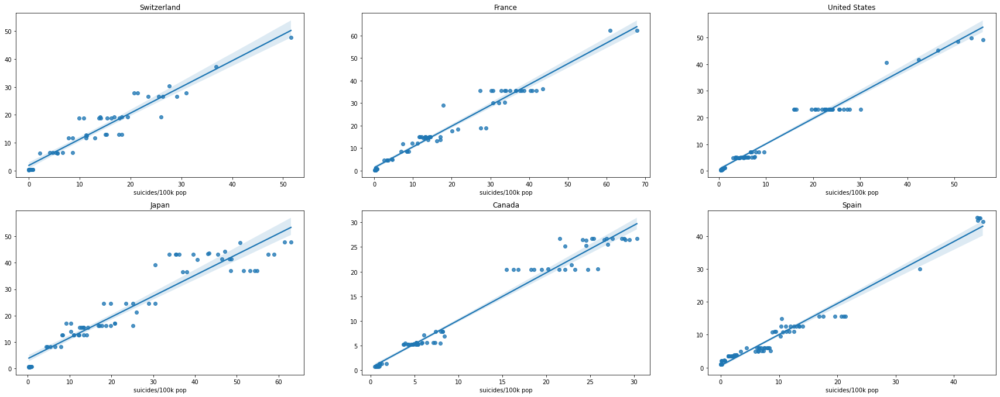

In [63]:

plt.figure(figsize=(30,30))
lst=['Switzerland','France','United States', 'Japan', 'Canada', 'Spain']
for i in range(len(lst)):
    arg=dict_df[lst[i]]
    X_train,X_test,y_train,y_test=train_test_split(arg.drop(columns=['suicides/100k pop']),arg['suicides/100k pop'],
                                              test_size=0.2,random_state=42)
    rf.fit(X_train,y_train)
    y_pred = rf.predict(X_test)
    r_squared = r2_score(y_test, y_pred)
    adjusted_r_squared = 1 - (1-r_squared)*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1)
    print("Adjusted R2 for",lst[i],"=",adjusted_r_squared)
    mse=mean_squared_error(y_test,rf.predict(X_test))
    print("The mean squared error on test set for",lst[i],"is=",mse)
    print("="*100)
    plt.subplot(5,3,i+1)
    sns.regplot(y_test,rf.predict(X_test))
    plt.title(lst[i])

## Conclusion of Regression Models

As we can see from the plots scattering of points is very less in the case of xgboost regressor.
<BR>Therotically, also we can see adjusted R2 values is closest to one in the case of XGBoost Regressor.
<BR>So, we conclude that XGBoost is the best regressor.

# Checking for the overfitting

In XGBoost as it fits best from all these

R2 for Switzerland = 0.9577190639154033
Adjusted R2 for Switzerland = 0.9515316098542428
The mean squared error on test set for Switzerland is= 4.932538881245886
R2 for France = 0.9858251900262675
Adjusted R2 for France = 0.9844309464222938
The mean squared error on test set for France is= 3.5343606888399477
R2 for United States = 0.9887700958925596
Adjusted R2 for United States = 0.9877792220007267
The mean squared error on test set for United States is= 2.090363152218446
R2 for Japan = 0.9590925788119766
Adjusted R2 for Japan = 0.9554292276608104
The mean squared error on test set for Japan is= 14.3789282509983
R2 for Canada = 0.9577864074172646
Adjusted R2 for Canada = 0.953766065266528
The mean squared error on test set for Canada is= 4.227273430838483
R2 for Spain = 0.9876501159176204
Adjusted R2 for Spain = 0.9865604202632928
The mean squared error on test set for Spain is= 1.5830709462739156


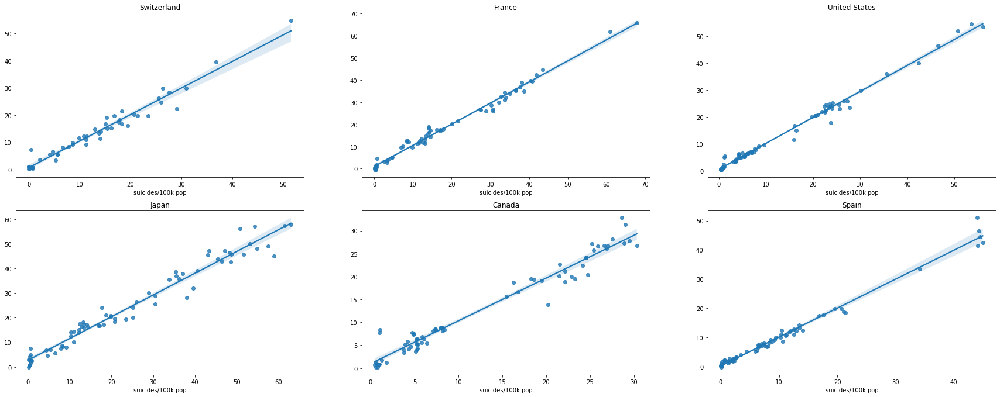

In [64]:

plt.figure(figsize=(30,30))
lst=['Switzerland','France','United States', 'Japan', 'Canada', 'Spain']
for i in range(len(lst)):
    arg=dict_df[lst[i]]
    X_train,X_test,y_train,y_test=train_test_split(arg.drop(columns=['suicides/100k pop']),arg['suicides/100k pop'],
                                              test_size=0.2,random_state=42)
    xgb.fit(X_train,y_train)
    y_pred = xgb.predict(X_test)
    r_squared = r2_score(y_test, y_pred)
    print("R2 for",lst[i],"=",r_squared)

    adjusted_r_squared = 1 - (1-r_squared)*(len(y_test)-1)/(len(y_test)-X_test.shape[1]-1)
    print("Adjusted R2 for",lst[i],"=",adjusted_r_squared)
    mse=mean_squared_error(y_test,xgb.predict(X_test))
    print("The mean squared error on test set for",lst[i],"is=",mse)
    print("="*100)
    plt.subplot(5,3,i+1)
    sns.regplot(y_test,xgb.predict(X_test))
    plt.title(lst[i])

We got that the R2 and adjusted R2 values to be nearly same, therefore our model does not overfit the data.

# Clusterization

In this section we will apply an unsupervised clustering algorithm, kmeans, to make groups of the countries that most resemble each other, in this way we can find which countries are most similar to each other and which characteristics are most relevant to each one.

For this we are going to transform the dataset to be able to do a clustering according to demographics and another according to the proportion of suicides of each group of indiduals.

## Clustering by Demographics¶
Now in the function below we are going to create our new dataset, in which we will see what percentage of each group of people there are in each country per year.

#### PreProcessing

In [65]:
#Forming DataFrame for Clusters

In [66]:
df_clusters_demografia = pd.DataFrame(columns=['country', 'year', 'population', 'female (%)', '5-14 years',
                                    '15-24 years', '25-34 years', '35-54 years', '55-74 years', '75+ years',
                                    'suicides/100k pop','gdp_per_capita ($)'])
df_clusters_demografia['country'] = data_cluster['country']
df_clusters_demografia['year'] = data_cluster['year']
df_clusters_demografia['population'] = data_cluster['population']
for i, fila in data_cluster.iterrows():
    if 'female' == fila['sex']:
        df_clusters_demografia.loc[i, 'female (%)'] = fila['population']
    #else:
        #df_clusters_demografia.loc[i, 'female (%)'] = fila['population']
    df_clusters_demografia.loc[i, fila['age']] = fila['population']
    df_clusters_demografia.loc[i, 'suicides/100k pop'] = data_without_missing.loc[i, 'suicides_no']

df_clusters_demografia = df_clusters_demografia.fillna(0)
df_clusters_demografia = df_clusters_demografia.groupby(['country', 'year'], as_index=False).sum()

df_rich = data_cluster.groupby(['country', 'year'], as_index=False).mean()
df_clusters_demografia['gdp_per_capita ($)'] = df_rich['gdp_per_capita ($)']
for i, fila in df_clusters_demografia.iterrows():
    df_clusters_demografia.loc[i, 'suicides/100k pop'] = (fila['suicides/100k pop'] / fila['population'])*100000
    df_clusters_demografia.loc[i, 'female (%)'] = (fila['female (%)'] / fila['population'])
    df_clusters_demografia.loc[i, '5-14 years'] = (fila['5-14 years'] / fila['population'])
    df_clusters_demografia.loc[i, '15-24 years'] = (fila['15-24 years'] / fila['population'])
    df_clusters_demografia.loc[i, '25-34 years'] = (fila['25-34 years'] / fila['population'])
    df_clusters_demografia.loc[i, '35-54 years'] = (fila['35-54 years'] / fila['population'])
    df_clusters_demografia.loc[i, '55-74 years'] = (fila['55-74 years'] / fila['population'])
    df_clusters_demografia.loc[i, '75+ years'] = (fila['75+ years'] / fila['population'])
    
scaler = preprocessing.MinMaxScaler()
a, aux = standarize(df_clusters_demografia.values[:,2:], df_clusters_demografia.values[:,2:])
nombres = list(df_clusters_demografia)
indice_fila = 0
for i, fila in df_clusters_demografia.iterrows():
    index = 0
    for index in range(len(nombres)-2):
        df_clusters_demografia.loc[i, nombres[index+2]] = a[indice_fila][index]
        index +=1
    indice_fila += 1
    
df_clusters_demografia.head()


,country,year,population,female (%),5-14 years,15-24 years,25-34 years,35-54 years,55-74 years,75+ years,suicides/100k pop,gdp_per_capita ($)
0,Albania,1987,0.008946,0.471144,0.657793,0.493323,0.370611,0.422196,0.275608,0.156709,0.086167,0.004322
1,Albania,1988,0.009129,0.471215,0.657688,0.493373,0.370698,0.422147,0.275482,0.157087,0.072892,0.004108
2,Albania,1989,0.009258,0.471725,0.657791,0.493331,0.370683,0.422144,0.275431,0.157024,0.077588,0.004615
3,Albania,1992,0.009323,0.502126,0.680506,0.392848,0.321192,0.481138,0.315494,0.164070,0.053258,0.000000
4,Albania,1993,0.009272,0.509312,0.691721,0.358278,0.298952,0.500509,0.331048,0.167330,0.083168,0.001475


As we can see, we have different attributes, but they are simply transformations of the information that we already had before. To speed things up, we have directly standardized the data with the MinMaxScaler. Let's go on to explain each attribute what it means:

country: It is the name of the country, it does not require standardization, it is our output.
<BR>year: Year, does not require standardization, we will differentiate the years.
<BR>population: Number of population that year in that country.
<BR>female (%): Percentage of women in the country.
<BR>5-14 years: Percentage of the population in the age range of 5 to 14 years.
<BR>15-24 years: Percentage of the population in the age range of 15 to 14 years.
<BR>25-34 years: Percentage of the population in the age range of 25 to 34 years.
<BR>35-54 years: Percentage of the population in the age range of 35 to 54 years.
<BR>55-74 years: Percentage of the population in the age range of 55 to 74 years.
<BR>75+ years: Percentage of the population over 75 years of age.
<BR>suicides/100k pop: Proportion of suicides per 100 thousand people.
<BR>gdp_per_capita ($): GDP per capita.

In [67]:
import pandas_profiling as pdp 

prof = pdp.ProfileReport(df_clusters_demografia)
prof.to_file(output_file='clusters_demografia.html')
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [68]:
df_clusters_demografia_2014 = df_clusters_demografia[df_clusters_demografia['year'] == 2014].drop(['country', 'year'], axis=1)
df_clusters_demografia_2014.shape

(78, 10)

In [69]:
df_clusters_demografia_2014

,population,female (%),5-14 years,15-24 years,25-34 years,35-54 years,55-74 years,75+ years,suicides/100k pop,gdp_per_capita ($)
47,0.000219,0.533048,0.502657,0.342620,0.245792,0.715950,0.362064,0.225501,0.000000,0.109769
78,0.130815,0.516293,0.502582,0.306370,0.266014,0.556050,0.493072,0.382445,0.263103,0.104274
102,0.009258,0.538857,0.360743,0.260591,0.338334,0.607935,0.566749,0.417579,0.066179,0.030856
147,0.072995,0.501344,0.362410,0.177135,0.237377,0.636388,0.669056,0.511389,0.421677,0.527815
178,0.026150,0.545983,0.285673,0.120814,0.196093,0.745600,0.781895,0.415829,0.450197,0.428442
...,...,...,...,...,...,...,...,...,...,...
2201,0.134773,0.563681,0.273716,0.097026,0.290232,0.674685,0.728940,0.570823,0.629799,0.024171
2238,0.201782,0.510475,0.334568,0.146347,0.193578,0.639257,0.716379,0.636478,0.252823,0.393772
2269,0.992239,0.506098,0.383598,0.203012,0.193625,0.614152,0.703079,0.487239,0.459410,0.462169
2297,0.010506,0.528241,0.429572,0.261477,0.201320,0.583973,0.582498,0.554237,0.594847,0.140847


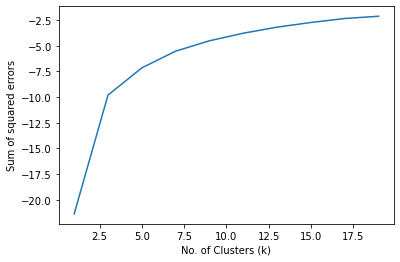

In [70]:
from sklearn.cluster import KMeans

nc = range(1, 20,2)
kmeans = [KMeans(n_clusters=i) for i in nc]
score = [kmeans[i].fit(df_clusters_demografia_2014).score(df_clusters_demografia_2014) for i in range(len(kmeans))]
score
plt.xlabel('No. of Clusters (k)')
plt.ylabel('Sum of squared errors')
plt.plot(nc,score)

We can see the elbow curve which tells us that the best k is the one in which this curve begins to smooth out, in this case it would be 10, but analyzing our data we see that we have few attributes, specifically 12 counting the year and the country they are not going to be used for the Kmeans. So so that there are not the same groups as attributes we are going to choose a k of 4.


In [71]:
kmeans_demografia_2014 = KMeans(n_clusters=4).fit(df_clusters_demografia_2014)
print(kmeans_demografia_2014.cluster_centers_)

[[0.00892447 0.21334646 0.35594851 0.22766797 0.77774097 0.75357968
  0.13085686 0.05695687 0.0416346  0.36515967]
 [0.05138103 0.55225779 0.30734658 0.13653635 0.22793261 0.67034902
  0.7493638  0.51076705 0.46323272 0.12751518]
 [0.0804905  0.50841739 0.52312842 0.38545672 0.3121671  0.58533937
  0.37836614 0.23737612 0.20772229 0.07850057]
 [0.13107547 0.50962897 0.32470408 0.11358313 0.17633177 0.67607662
  0.74001959 0.62296223 0.39741536 0.4765715 ]]


We can see the values of the centroids, now we will represent them to make them more understandable.


In [72]:
centroids_demografia_2014 = kmeans_demografia_2014.cluster_centers_
name_centroids = []
for i in range(centroids_demografia_2014.shape[0]):
    name_centroids.append('centroid '+str(i))
df_centroids_demografia_2014 = pd.DataFrame(data=centroids_demografia_2014.transpose(), index=list(df_clusters_demografia_2014), columns=name_centroids)
df_centroids_demografia_2014

,centroid 0,centroid 1,centroid 2,centroid 3
population,0.008924,0.051381,0.080491,0.131075
female (%),0.213346,0.552258,0.508417,0.509629
5-14 years,0.355949,0.307347,0.523128,0.324704
15-24 years,0.227668,0.136536,0.385457,0.113583
25-34 years,0.777741,0.227933,0.312167,0.176332
35-54 years,0.753580,0.670349,0.585339,0.676077
55-74 years,0.130857,0.749364,0.378366,0.740020
75+ years,0.056957,0.510767,0.237376,0.622962
suicides/100k pop,0.041635,0.463233,0.207722,0.397415
gdp_per_capita ($),0.365160,0.127515,0.078501,0.476572


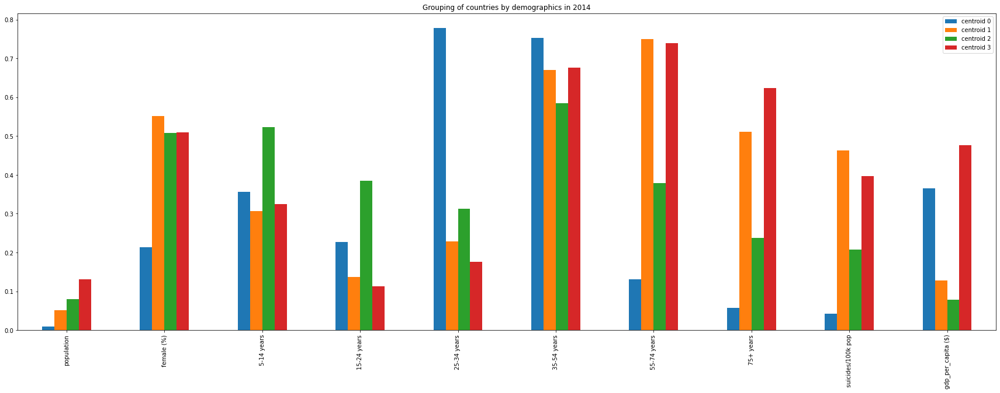

In [73]:
plot_dem_2014 = df_centroids_demografia_2014.plot(kind='bar', figsize=[30,10],
                                            title='Grouping of countries by demographics in 2014')

We have created 4 different groups according to demographics in 2014, we are going to define each of these groups and see what characteristics each one has.

Cluster 0: These countries have few suicides and are the poorest countries, their population is large and balanced in gender, the most common age range is from 35 to 54 years and from 5 to 14 years.

Cluster 1: These are countries with the highest suicide rate and they are the richest, their population is very large and predominantly over the ages of 34, the gender of the population is balanced.

Cluster 2: This group is made up of countries with high rate of suicides, a very small population and rich countries, with a low percentage of women and a population in the young and middle age range, between 25 and 54, the population older than this age is very scarce in this countries.

Cluster 3: It is the group with the low rate of suicides and they are countries with a low economic level. Its population is more abundant in the age ranges over 34 years, there is not large not small population and the percentage of men and women is balanced but with a slight dominance of the female population.

# Clustering by group suicide ratio¶

##### PreProcessing


We are going to create the new dataset with which we will see for each country and year what proportion of suicides there is for each group of people.


In [74]:
df_clusters_rate = pd.DataFrame(columns=['country', 'year', 'population', 'male', 'female', '5-14 years',
                                    '15-24 years', '25-34 years', '35-54 years', '55-74 years', '75+ years',
                                    'suicides/100k pop', 'gdp_per_capita ($)'])
df_clusters_rate['country'] = data_cluster['country']
df_clusters_rate['year'] = data_cluster['year']
df_clusters_rate['population'] = data_cluster['population']
for i, fila in data_cluster.iterrows():
    if 'male' == fila['sex']:
        df_clusters_rate.loc[i, 'male'] = data_without_missing.loc[i, 'suicides_no']
    else:
        df_clusters_rate.loc[i, 'female'] = data_without_missing.loc[i, 'suicides_no']
    df_clusters_rate.loc[i, fila['age']] = data_without_missing.loc[i, 'suicides_no']
    df_clusters_rate.loc[i, 'suicides/100k pop'] = data_without_missing.loc[i, 'suicides_no']
    
df_clusters_rate = df_clusters_rate.fillna(0)
df_clusters_rate = df_clusters_rate.groupby(['country', 'year'], as_index=False).sum()

df_rich = data_cluster.groupby(['country', 'year'], as_index=False).mean()
df_clusters_rate['gdp_per_capita ($)'] = df_rich['gdp_per_capita ($)']
for i, fila in df_clusters_rate.iterrows():
    df_clusters_rate.loc[i, 'suicides/100k pop'] = (fila['suicides/100k pop'] / fila['population'])*100000
    df_clusters_rate.loc[i, 'male'] = (fila['male'] / fila['population'])*100000
    df_clusters_rate.loc[i, 'female'] = (fila['female'] / fila['population'])*100000
    df_clusters_rate.loc[i, '5-14 years'] = (fila['5-14 years'] / fila['population'])*100000
    df_clusters_rate.loc[i, '15-24 years'] = (fila['15-24 years'] / fila['population'])*100000
    df_clusters_rate.loc[i, '25-34 years'] = (fila['25-34 years'] / fila['population'])*100000
    df_clusters_rate.loc[i, '35-54 years'] = (fila['35-54 years'] / fila['population'])*100000
    df_clusters_rate.loc[i, '55-74 years'] = (fila['55-74 years'] / fila['population'])*100000
    df_clusters_rate.loc[i, '75+ years'] = (fila['75+ years'] / fila['population'])*100000
    
scaler = preprocessing.MinMaxScaler()
a, aux = standarize(df_clusters_rate.values[:,2:], df_clusters_rate.values[:,2:])
nombres = list(df_clusters_rate)
print(type(a))
indice_fila = 0
for i, fila in df_clusters_rate.iterrows():
    index = 0
    for index in range(len(nombres)-2):
        df_clusters_rate.loc[i, nombres[index+2]] = a[indice_fila][index]
        index +=1
    indice_fila += 1
    
df_clusters_rate

<class 'numpy.ndarray'>


,country,year,population,male,female,5-14 years,15-24 years,25-34 years,35-54 years,55-74 years,75+ years,suicides/100k pop,gdp_per_capita ($)
0,Albania,1987,0.008946,0.072344,0.057497,0.000000,0.111314,0.050086,0.055676,0.003709,0.017727,0.086167,0.004322
1,Albania,1988,0.009129,0.060571,0.049596,0.000000,0.077937,0.037766,0.044652,0.025452,0.026064,0.072892,0.004108
2,Albania,1989,0.009258,0.077215,0.033348,0.000000,0.052263,0.074486,0.053819,0.025099,0.017136,0.077588,0.004615
3,Albania,1992,0.009323,0.047747,0.030911,0.000000,0.048851,0.040686,0.034013,0.021366,0.000000,0.053258,0.000000
4,Albania,1993,0.009272,0.066917,0.059936,0.022744,0.085952,0.059500,0.041525,0.032222,0.008555,0.083168,0.001475
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2316,Uzbekistan,2010,0.085407,0.160954,0.110051,0.097072,0.152520,0.133487,0.126177,0.046234,0.013107,0.182535,0.010166
2317,Uzbekistan,2011,0.086494,0.176539,0.124021,0.089709,0.169845,0.164763,0.141222,0.036755,0.013867,0.201911,0.012022
2318,Uzbekistan,2012,0.087840,0.188852,0.145272,0.100436,0.210363,0.173321,0.128143,0.060194,0.017296,0.222461,0.013584
2319,Uzbekistan,2013,0.089363,0.201156,0.145817,0.109431,0.206459,0.184372,0.148189,0.052428,0.018791,0.232377,0.015059


As before, we will explain the new attributes that have been created:

<BR>country: It is the name of the country, it does not require standardization.
<BR>year: Year, does not require standardization, we will differentiate the years.
<BR>population: Number of population that year in that country.
<BR>female: Proportion per 100 thousand people of women who have committed suicide.
<BR>male: Proportion per 100 thousand people of men who have committed suicide.
<BR>5-14 years: Proportion per 100 thousand people in the age range of 5 to 14 years who have committed suicide.
<BR>15-24 years: Proportion per 100 thousand people in the age range of 15 to 14 years who have committed suicide.
<BR>25-34 years: Proportion per 100 thousand people in the age range of 25 to 34 years who have committed suicide.
<BR>35-54 years: Proportion per 100 thousand people in the age range of 35 to 54 years who have committed suicide.
<BR>55-74 years: Proportion per 100 thousand people in the age range of 55 to 74 years who have committed suicide.
<BR>75+ years: Proportion per 100,000 people aged over 75 years.
<BR>suicides/100k pop: Proportion of suicides per 100 thousand people.
<BR>gdp_per_capita ($): GDP per capita.

The next thing we are going to do is see a report of this dataframe to see if we have something relevant to highlight.


In [88]:
df_clusters_rate_2014 = df_clusters_rate[df_clusters_rate['year'] == 2014].drop(['country', 'year'], axis=1)
df_clusters_rate_2014.shape

(78, 11)

In [89]:
df_clusters_rate_2014.head()

,population,male,female,5-14 years,15-24 years,25-34 years,35-54 years,55-74 years,75+ years,suicides/100k pop,gdp_per_capita ($)
47,0.000219,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.109769
78,0.130815,0.264515,0.109002,0.056083,0.206683,0.172502,0.146656,0.131532,0.132688,0.263103,0.104274
102,0.009258,0.062648,0.033349,0.011389,0.015372,0.022346,0.036696,0.057371,0.128520,0.066179,0.030856
147,0.072995,0.406379,0.201497,0.030574,0.144233,0.248996,0.357445,0.287853,0.228909,0.421677,0.527815
178,0.026150,0.406746,0.256506,0.008111,0.105099,0.171085,0.360657,0.497974,0.234929,0.450197,0.428442


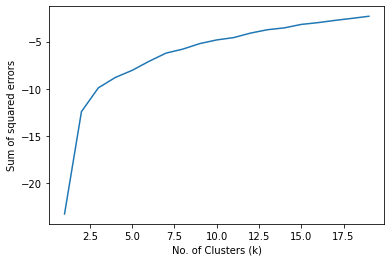

In [90]:
nc = range(1, 20)
kmeans = [KMeans(n_clusters=i) for i in nc]
score = [kmeans[i].fit(df_clusters_rate_2014).score(df_clusters_rate_2014) for i in range(len(kmeans))]
score
plt.xlabel('No. of Clusters (k)')
plt.ylabel('Sum of squared errors')
plt.plot(nc,score)

Here we can see the elbow curve that indicate that the best k would be around an approximate value of 5, so groups of 5 different groups will be made.

In [91]:
kmeans_rate_204 = KMeans(n_clusters=5).fit(df_clusters_rate_2014)
print(kmeans_rate_204.cluster_centers_)

[[0.05842977 0.28415287 0.10752031 0.03230368 0.08421721 0.13849226
  0.22038664 0.22843818 0.1901074  0.27772236 0.14513118]
 [0.02402173 0.37947286 0.20576011 0.01809266 0.1039675  0.19514377
  0.30595849 0.37014891 0.31627765 0.40279348 0.57943963]
 [0.06725973 0.58664024 0.28104587 0.0424175  0.16866477 0.35154685
  0.46188543 0.53297958 0.33114191 0.60367945 0.12281772]
 [0.27760917 0.44310144 0.24329774 0.01800364 0.07764767 0.16401587
  0.34601289 0.45504285 0.63702326 0.4718908  0.31277876]
 [0.07826278 0.12200347 0.06024124 0.03895141 0.08040636 0.10179763
  0.08278822 0.05420682 0.04259567 0.12646691 0.12502265]]



Well here we have the centroids of each cluster, but this is not very visual and it is difficult to interpret, so we are going to represent them graphically and from here we will draw the pertinent conclusions.

In [92]:
centroids_rate_2014 = kmeans_rate_204.cluster_centers_
name_centroids = []
for i in range(centroids_rate_2014.shape[0]):
    name_centroids.append('centroid '+str(i))
df_centroids_rate_2014 = pd.DataFrame(data=centroids_rate_2014.transpose(), index=list(df_clusters_rate_2014), columns=name_centroids)
df_centroids_rate_2014

,centroid 0,centroid 1,centroid 2,centroid 3,centroid 4
population,0.058430,0.024022,0.067260,0.277609,0.078263
male,0.284153,0.379473,0.586640,0.443101,0.122003
female,0.107520,0.205760,0.281046,0.243298,0.060241
5-14 years,0.032304,0.018093,0.042418,0.018004,0.038951
15-24 years,0.084217,0.103967,0.168665,0.077648,0.080406
25-34 years,0.138492,0.195144,0.351547,0.164016,0.101798
35-54 years,0.220387,0.305958,0.461885,0.346013,0.082788
55-74 years,0.228438,0.370149,0.532980,0.455043,0.054207
75+ years,0.190107,0.316278,0.331142,0.637023,0.042596
suicides/100k pop,0.277722,0.402793,0.603679,0.471891,0.126467


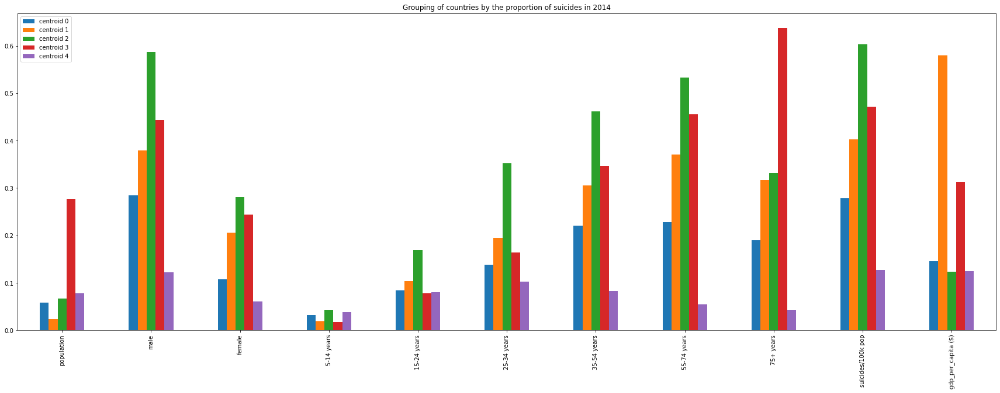

In [93]:
plot_rate_2014 = df_centroids_rate_2014.plot(kind='bar', figsize=[30,10],
                                            title ='Grouping of countries by the proportion of suicides in 2014')

We are going to differentiate the 5 groups formed by the suicide rates of each type of person:

Cluster Yellow: The first group is made up of countries with the highest proportion of suicides, they are poor countries and with a low population value. Men commit suicide in a much higher proportion than women and the most prone age range is 55 to 74 years, with the youngest being the least likely to commit suicide.

Cluster Green: These countries are very rich and have high suicide rate, the population is large and it is also men who commit suicide the most, the highest range in suicides is from 75+ years and the smallest barely they commit suicide

Cluster Purple: They are a group with a relatively low suicide rate, they are poor and with a large population, the male gender dominates as the most prone and the population between 25 and 54 is frequent.

Cluster Red: They are the group with a high suicide rate and are richest than the previous group. Its population is abundant and prone to suicides of men between 55 and 74 years old.

Cluster Blue: This is a group with a very low suicide rate and a good economic level, the population is scarce and it is men who commit suicide in a greater proportion, with the range of 25 to 34 being the ones who commit the most suicides.


# Conclusion

So, we have used four models i.e. Multiple Linear Regression model,Gradient Boosting, XGBoost and Random Forest Classifier. We can observe that the r2 value in the xgboost model is closest to 1 (irrespective of the country). Hence, we can say that the XGBoost model is the best predictor model. 

Then we have used the clustering method to have an idea about the patterns present in the dataset. So, firstly we have done clustering by demographics and found out that the number of clusters formed are 4. here the clusters are formed according to the whole population. 

Then, we have made clusters by suicide ratio and here we can observe that 5 clusters are formed and in this case clusters are formed according to the suicide rates.